## Edge detection using morphological operations 
N

(use any image for input)

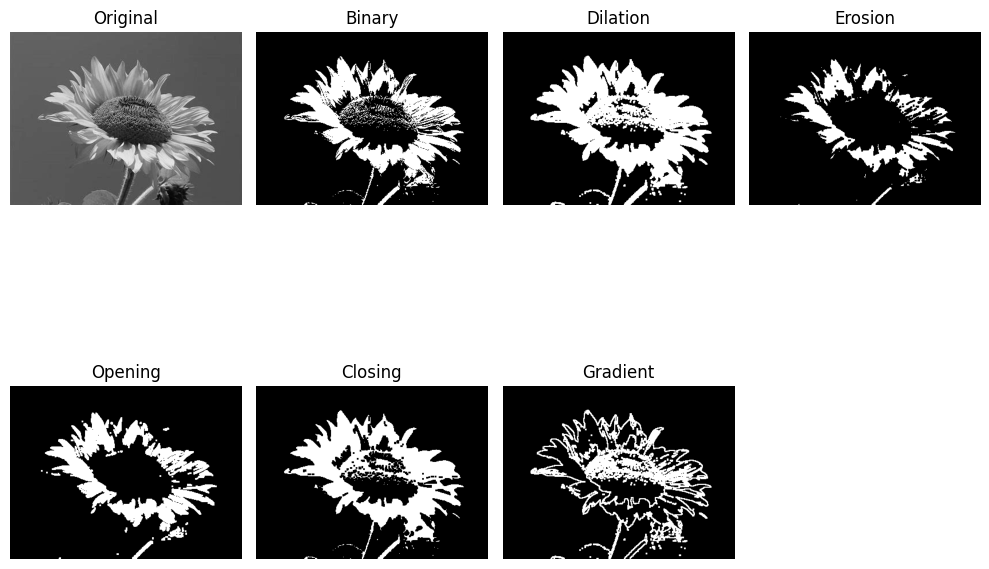

In [3]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

def edge_detection_morphological():
    image = cv2.imread('sunflower.jpeg', cv2.IMREAD_GRAYSCALE)

    
    binary = cv2.threshold(image, 0, 255, cv2.THRESH_BINARY+cv2.THRESH_OTSU)[1]

    kernel = np.ones((3, 3), np.uint8)

    dilation = cv2.dilate(binary, kernel, iterations=1)
    erosion = cv2.erode(binary, kernel, iterations=1)
    opening = cv2.morphologyEx(binary, cv2.MORPH_OPEN, kernel)
    closing = cv2.morphologyEx(binary, cv2.MORPH_CLOSE, kernel)

    gradient = cv2.morphologyEx(binary, cv2.MORPH_GRADIENT, kernel)

    titles = ['Original', 'Binary', 'Dilation', 'Erosion', 'Opening', 'Closing', 'Gradient']
    images = [image, binary, dilation, erosion, opening, closing, gradient]

    plt.figure(figsize=(10, 8))
    for i in range(len(images)):
        plt.subplot(2, 4, i + 1)
        plt.imshow(images[i], cmap='gray')
        plt.title(titles[i])
        plt.axis('off')

    plt.tight_layout()
    plt.show()


edge_detection_morphological()


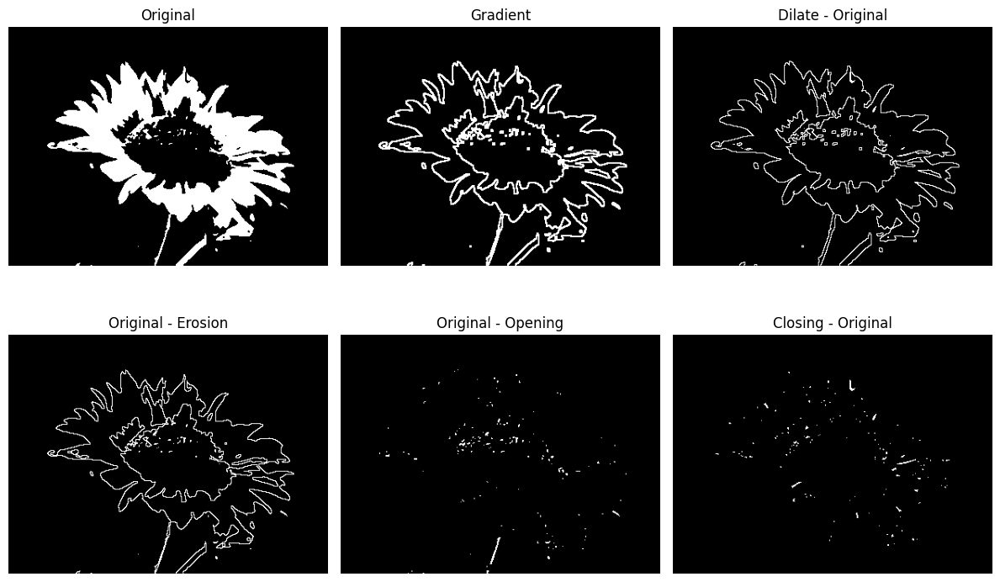

In [5]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

def edge_detection_morphological():
    
    image = cv2.imread('sunflower.jpeg', cv2.IMREAD_GRAYSCALE)

    blurred = cv2.GaussianBlur(image, (5, 5), 0)
    binary = cv2.threshold(blurred, 0, 255, cv2.THRESH_BINARY+cv2.THRESH_OTSU)[1]

  
    kernel = np.ones((3, 3), np.uint8)

   
    gradient = cv2.morphologyEx(binary, cv2.MORPH_GRADIENT, kernel)
    edge_dilate = cv2.subtract(cv2.dilate(binary, kernel), binary)
    edge_erode = cv2.subtract(binary, cv2.erode(binary, kernel))
    opened = cv2.morphologyEx(binary, cv2.MORPH_OPEN, kernel)
    edges_open = cv2.subtract(binary, opened)
    closed = cv2.morphologyEx(binary, cv2.MORPH_CLOSE, kernel)
    edges_close = cv2.subtract(closed, binary)

    
    titles = ['Original', 'Gradient', 'Dilate - Original', 'Original - Erosion', 'Original - Opening', 'Closing - Original']
    images = [binary, gradient, edge_dilate, edge_erode, edges_open, edges_close]

    plt.figure(figsize=(12, 8))
    for i in range(len(images)):
        plt.subplot(2, 3, i + 1)
        plt.imshow(images[i], cmap='gray')
        plt.title(titles[i])
        plt.axis('off')

    plt.tight_layout()
    plt.show()

edge_detection_morphological()


# Automatic Thresholding 
A
(any image as input)
(output: binary image)

In [9]:

image_path = r"StaresIntoMeHelpPlzIAmGoingInsaneWTF.jpg"  

def auto_thresh(image_path, stop_at=0.00001):
    # Read the image in grayscale
    image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)
    if image is None:
        raise FileNotFoundError(f"Image not found at {image_path}. Please check the file path.")

    current_avg = np.mean(image)

    while True:
        # Divide the pixels into two groups: below and above the current threshold
        below = image[image < current_avg]
        above = image[image >= current_avg]

        # Calculate the average intensity for each group
        avg_below = np.mean(below) if below.size > 0 else 0
        avg_above = np.mean(above) if above.size > 0 else 255

        # Compute the new threshold
        new_avg = (avg_below + avg_above) / 2

        # Check if the difference between the new and current threshold is below the stopping condition
        if abs(new_avg - current_avg) < stop_at:
            break

        # Update the current average for the next iteration
        current_avg = new_avg

    # Apply binary thresholding using the computed threshold
    _, thresholded_image = cv2.threshold(image, new_avg, 255, cv2.THRESH_BINARY)

    return thresholded_image, new_avg


Final Threshold Value: 104.87


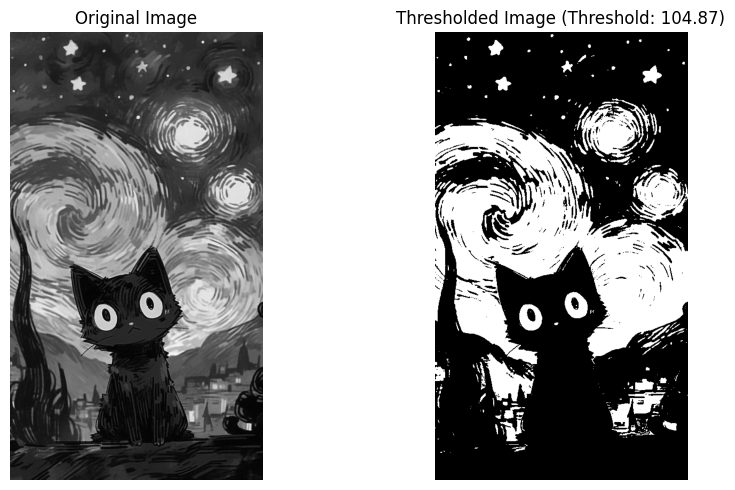

In [10]:
try:
    thresholded_image, final_threshold = auto_thresh(image_path)
    print(f"Final Threshold Value: {round(final_threshold, 2)}")

    # Plot the original and thresholded images
    original_image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)

    # Create a figure with two subplots
    plt.figure(figsize=(10, 5))

    # Plot the original image
    plt.subplot(1, 2, 1)
    plt.imshow(original_image, cmap='gray')
    plt.title("Original Image")
    plt.axis('off')  # Hide the axes

    # Plot the thresholded image
    plt.subplot(1, 2, 2)
    plt.imshow(thresholded_image, cmap='gray')
    plt.title(f"Thresholded Image (Threshold: {round(final_threshold, 2)})")
    plt.axis('off')  # Hide the axes

    # Show the plots
    plt.tight_layout()
    plt.show()

except FileNotFoundError as e:
    print(e)

# Morphological operations

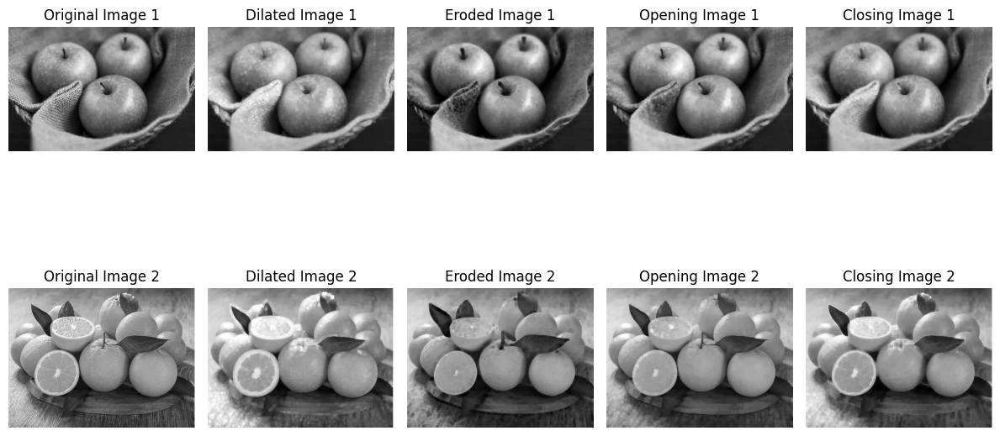

In [8]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Load the two images
image1 = cv2.imread(r"greenApple.jpeg", cv2.IMREAD_COLOR)
image2 = cv2.imread(r"OIP.jpeg", cv2.IMREAD_COLOR)

# Convert to grayscale
gray1 = cv2.cvtColor(image1, cv2.COLOR_BGR2GRAY)
gray2 = cv2.cvtColor(image2, cv2.COLOR_BGR2GRAY)

# Define a kernel (structuring element)
kernel = np.ones((5, 5), np.uint8)  # You can adjust the size and shape

# Apply dilation
dilated1 = cv2.dilate(gray1, kernel, iterations=1)
dilated2 = cv2.dilate(gray2, kernel, iterations=1)

# Apply erosion
eroded1 = cv2.erode(gray1, kernel, iterations=1)
eroded2 = cv2.erode(gray2, kernel, iterations=1)

# Apply opening (erosion followed by dilation)
opening1 = cv2.morphologyEx(gray1, cv2.MORPH_OPEN, kernel)
opening2 = cv2.morphologyEx(gray2, cv2.MORPH_OPEN, kernel)

# Apply closing (dilation followed by erosion)
closing1 = cv2.morphologyEx(gray1, cv2.MORPH_CLOSE, kernel)
closing2 = cv2.morphologyEx(gray2, cv2.MORPH_CLOSE, kernel)

# Display results
titles = ['Original Image 1', 'Dilated Image 1', 'Eroded Image 1', 'Opening Image 1', 'Closing Image 1',
          'Original Image 2', 'Dilated Image 2', 'Eroded Image 2', 'Opening Image 2', 'Closing Image 2']
images = [gray1, dilated1, eroded1, opening1, closing1,
          gray2, dilated2, eroded2, opening2, closing2]

plt.figure(figsize=(12, 8))
for i in range(10):
    plt.subplot(2, 5, i + 1)
    plt.imshow(images[i], cmap='gray')
    plt.title(titles[i])
    plt.axis('off')
plt.tight_layout()
plt.show()


# Hit or miss

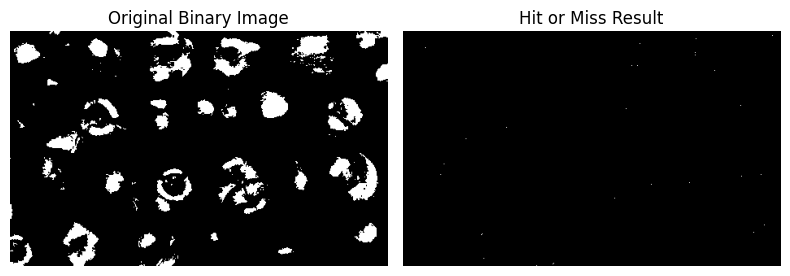

In [13]:
# Load the image
path8 = cv2.imread(r"apple.jpeg", cv2.IMREAD_COLOR)
# Convert to grayscale
gray_image = cv2.cvtColor(path8, cv2.COLOR_BGR2GRAY)
# Convert to binary
_, binary = cv2.threshold(gray_image, 127, 255, cv2.THRESH_BINARY)

# Define a kernel for hit-or-miss
# Kernel values: 1 (foreground), 0 (background), -1 (don't care)
kernel_hit_or_miss = np.array([[0, 1, 0],
                                [1, -1, 1],
                                [0, 1, 0]], dtype=np.int8)

# Hit-or-Miss operation
hit_or_miss = cv2.morphologyEx(binary, cv2.MORPH_HITMISS, kernel_hit_or_miss)

# Display results
titles = ['Original Binary Image', 'Hit or Miss Result']
images = [binary, hit_or_miss]

plt.figure(figsize=(8, 4))
for i in range(2):
    plt.subplot(1, 2, i + 1)
    plt.imshow(images[i], cmap='gray')
    plt.title(titles[i])
    plt.axis('off')

plt.tight_layout()
plt.show()

# Convex Hull

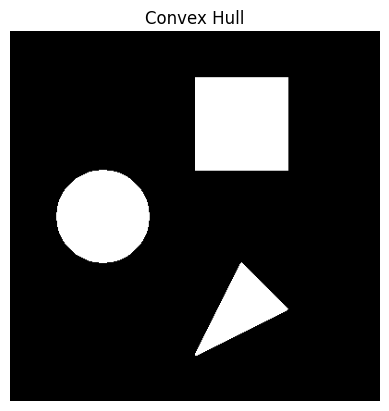

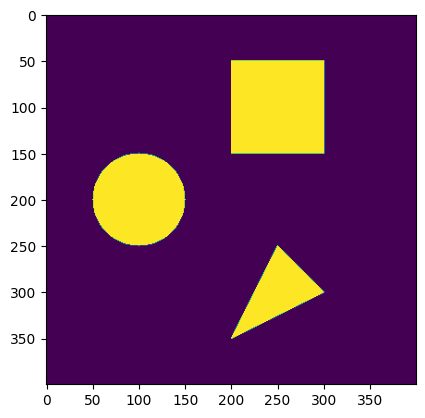

In [14]:

image22 = np.zeros((400, 400), dtype=np.uint8)
cv2.circle(image22, (100, 200), 50, 255, -1)
cv2.rectangle(image22, (200, 50), (300, 150), 255, -1)


cv2.fillPoly(image22, [np.array([[250, 250], [300, 300], [200, 350]], dtype=np.int32)], 255)  # Filled triangle

# Find contours (compatible with both OpenCV 3.x and 4.x)
result = cv2.findContours(image22, cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)
contours = result[-2]

# Create an empty image to draw convex hulls
hull_image = np.zeros_like(image22)

# Draw convex hulls
for contour in contours:
    hull = cv2.convexHull(contour)
    cv2.drawContours(hull_image, [hull], 0, 255, -1)

# Display the convex hull result
plt.imshow(hull_image, cmap='gray')
plt.title('Convex Hull')
plt.axis('off')
plt.show()
plt.imshow(image22)

# Task 1: rgb channel swapping,elimination then printing the output image

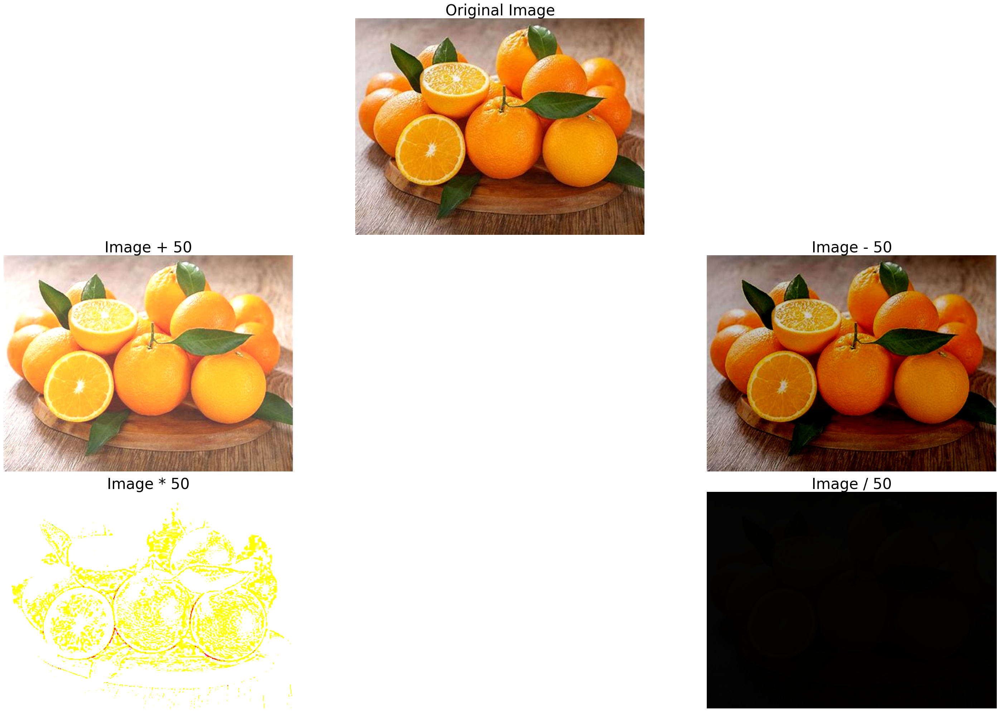

In [15]:
path1 = cv2.imread(r"OIP.jpeg")
image_rgb = cv2.cvtColor(path1, cv2.COLOR_BGR2RGB)
value = 50

add_img = cv2.add(image_rgb, value)
sub_img = cv2.subtract(image_rgb, value)
mul_img = cv2.multiply(image_rgb, value)
div_img = cv2.divide(image_rgb, value)

plt.figure(figsize=(30, 20))

plt.subplot(3, 3, 2)
plt.title("Original Image", fontsize=30)
plt.imshow(image_rgb)
plt.axis('off')

plt.subplot(3, 3, 4)
plt.title("Image + 50", fontsize=30)
plt.imshow(add_img)
plt.axis('off')

plt.subplot(3, 3, 6)
plt.title("Image - 50", fontsize=30)
plt.imshow(sub_img)
plt.axis('off')

plt.subplot(3, 3, 7)
plt.title("Image * 50", fontsize=30)
plt.imshow(mul_img)
plt.axis('off')

plt.subplot(3, 3, 9)
plt.title("Image / 50", fontsize=30)
plt.imshow(div_img)
plt.axis('off')

plt.tight_layout()
plt.show()

cv2.waitKey(0)
cv2.destroyAllWindows()


# Swapping and Eliminating

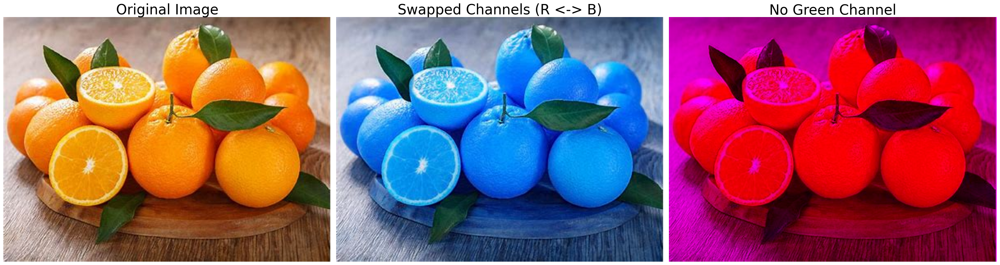

In [16]:


path4= cv2.imread(r"OIP.jpeg")
image_rgb = cv2.cvtColor(path4, cv2.COLOR_BGR2RGB)

R, G, B = cv2.split(image_rgb)
swapped_image = cv2.merge([B, G, R])
no_green_image = cv2.merge([R, G * 0, B])

plt.figure(figsize=(30, 20))


plt.subplot(1, 3, 1)
plt.title("Original Image", fontsize=30)
plt.imshow(image_rgb)
plt.axis('off')


plt.subplot(1, 3, 2)
plt.title("Swapped Channels (R <-> B)", fontsize=30)
plt.imshow(swapped_image)
plt.axis('off')


plt.subplot(1, 3, 3)
plt.title("No Green Channel", fontsize=30)
plt.imshow(no_green_image)
plt.axis('off')

plt.tight_layout()
plt.show()

# Task 2: apply convolution  using opencv functions and display output

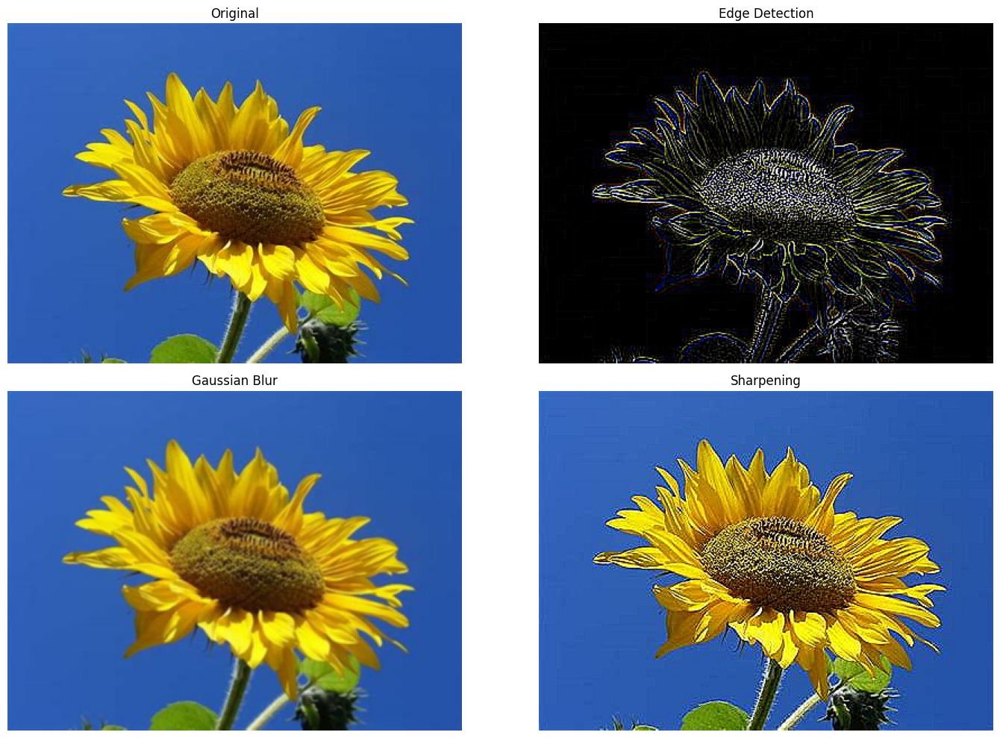

In [18]:
path7 = cv2.imread(r"sunflower.jpeg", cv2.IMREAD_COLOR)

image_rgb = cv2.cvtColor(path7, cv2.COLOR_BGR2RGB)

kernels = {
    "Edge Detection": np.array([[1, 1, 1],
                                [1, -8, 1],
                                [1, 1, 1]], dtype=np.float32),

    "Gaussian Blur": (1 / 16) * np.array([[1, 2, 1],
                                          [2, 4, 2],
                                          [1, 2, 1]], dtype=np.float32),

    "Sharpening": np.array([[0, -1, 0],
                            [-1, 5, -1],
                            [0, -1, 0]], dtype=np.float32)
}

results = {"Original": image_rgb}
for name, kernel in kernels.items():
    convolved = cv2.filter2D(path7, -1, kernel)
    results[name] = cv2.cvtColor(convolved, cv2.COLOR_BGR2RGB)

plt.figure(figsize=(15, 10))

for i, (title, img) in enumerate(results.items()):
    plt.subplot(2, 2, i + 1)
    plt.title(title)
    plt.imshow(img)
    plt.axis('off')

plt.tight_layout()
plt.show()

# LBP

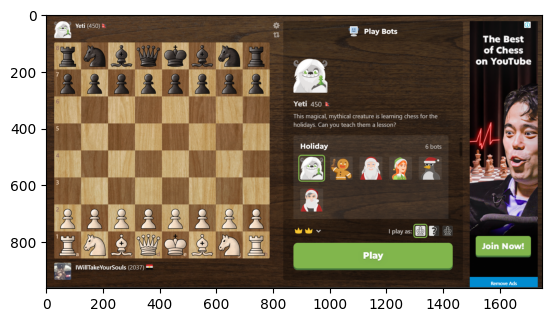

In [19]:
import cv2
import matplotlib.pyplot as plt
image = cv2.imread("Screenshot 2024-12-14 003828.png")
image_rgb = cv2.cvtColor(image,cv2.COLOR_BGR2RGB) # for matplot plotting
grayImage = cv2.imread("Screenshot 2024-12-14 003828.png",0)

#plt.imshow(image) # shows blue apples because matplot reads RGB, opencv reads BGR
plt.imshow(image_rgb) 

In [20]:
import numpy as np

LBp_1 = np.zeros_like(grayImage)
#print(LBp_1.size)
#print(grayImage.size)
row, column = LBp_1.shape #returns rows, columns into the variables.

print(f"LBp_1 rows: {row}, LBp_1 columns: {column}")
newImg = LBp_1.copy()
for i in range(1,row-2):
    for j in range(1,column-2):
        pixel = grayImage[i,j]
        pixel7=int(grayImage[i-1, j-1] > pixel )            
        pixel6=int(grayImage[i-1, j] > pixel )    
        pixel5=int(grayImage[i-1, j+1] > pixel)               
        pixel4=int(grayImage[i, j+1] > pixel)            
        pixel3=int(grayImage[i+1, j+1] > pixel)         
        pixel2=int(grayImage[i+1, j] > pixel ) 
        pixel1=int(grayImage[i+1, j-1] > pixel )
        pixel0=int(grayImage[i, j-1] > pixel)  
        sumTotal=np.uint8(pixel7 * 2**7 + pixel6 * 2**6 + pixel5 * 2**5 + pixel4 * 2**4 + pixel3 * 2**3 + pixel2 * 2**2 + pixel1 * 2 + pixel0)
        newImg[i,j] = sumTotal

LBp_1 rows: 964, LBp_1 columns: 1750


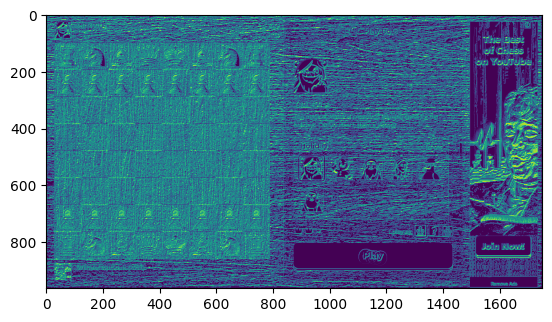

In [21]:
plt.imshow(newImg)